# Exponax Data Visualization


In [1]:
import sys
sys.path.insert(0, '..')

import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from flowpde.datasets.exponax import (
    BurgersGenerator, BurgersConfig,
    PoissonGenerator, PoissonConfig,
    DarcyGenerator, DarcyConfig, DarcyDataset,
)

# Set plotting style
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 11
plt.style.use('seaborn-v0_8-whitegrid')


## Generate Burgers 1D Data

Generate the Burgers equation dataset directly using the Exponax integration module.

In [2]:
# Configure and generate Burgers 1D data (with full trajectory)
burgers_cfg = BurgersConfig(
    num_spatial_dims=1,
    num_points=160,
    domain_extent=1.0,
    dt=0.001,
    num_steps=400,
    diffusivity_min=1e-3,    # log-uniform viscosity range (smooth ↔ shock-dominated)
    diffusivity_max=1e-1,
    amplitude_min=0.1,       # per-sample amplitude scaling
    amplitude_max=3.0,
    ic_cutoff_min=3,         # per-sample spectral cutoff range
    ic_cutoff_max=15,
    gaussian_bump_prob=0.5,  # 50% chance of Gaussian-bump IC
    num_samples=50,
    seed=0,
    store_trajectory=True,
)

burgers_gen = BurgersGenerator(config=burgers_cfg)
burgers_dataset = burgers_gen.generate()

# Access the raw data tensors
burgers_data = burgers_dataset.get_raw_data()

print("\nBurgers 1D Dataset")
print("=" * 50)
print(f"Data keys: {list(burgers_data.keys())}")
print(f"\nShapes:")
print(f"  Initial conditions:   {burgers_data['initial'].shape}")
print(f"  Final states:         {burgers_data['final'].shape}")
print(f"  Trajectories:         {burgers_data['trajectory'].shape}")
print(f"  Per-sample ν values:  {burgers_data['diffusivity'].shape}")
print(f"\nGeneration config:")
cfg_dict = burgers_dataset.get_config()
print(f"  Resolution:           {cfg_dict['num_points']}")
print(f"  Samples:              {cfg_dict['num_samples']}")
print(f"  ν range:              [{cfg_dict['diffusivity_min']:.1e}, {cfg_dict['diffusivity_max']:.1e}]  (log-uniform)")
print(f"  Amplitude range:      [{cfg_dict['amplitude_min']}, {cfg_dict['amplitude_max']}]")
print(f"  Spectral cutoff:      [{cfg_dict['ic_cutoff_min']}, {cfg_dict['ic_cutoff_max']}]  (per-sample)")
print(f"  Gaussian bump prob:   {cfg_dict['gaussian_bump_prob']}")
print(f"  Time steps:           {cfg_dict['num_steps']}")
print(f"  dt:                   {cfg_dict['dt']}")


Generated Burgers 1D dataset: 50 samples, 160 grid, 400 steps (dt=0.001), ν ~ LogUniform(1e-03, 1e-01)

Burgers 1D Dataset
Data keys: ['initial', 'final', 'diffusivity', 'trajectory']

Shapes:
  Initial conditions:   torch.Size([50, 1, 160])
  Final states:         torch.Size([50, 1, 160])
  Trajectories:         torch.Size([50, 401, 1, 160])
  Per-sample ν values:  torch.Size([50])

Generation config:
  Resolution:           160
  Samples:              50
  ν range:              [1.0e-03, 1.0e-01]  (log-uniform)
  Amplitude range:      [0.1, 3.0]
  Spectral cutoff:      [3, 15]  (per-sample)
  Gaussian bump prob:   0.5
  Time steps:           400
  dt:                   0.001


## Per-Sample Viscosity Distribution

Each Burgers sample has its own viscosity $\nu$ drawn from a log-uniform distribution, producing a dataset that spans both smooth (high $\nu$) and shock-dominated (low $\nu$) regimes simultaneously.


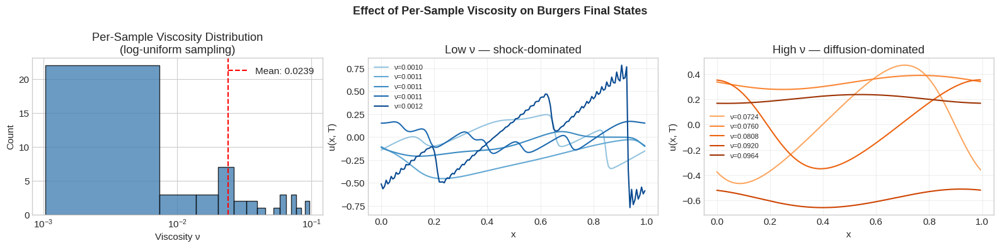

In [3]:
# Show the log-uniform ν distribution and its physical effect on solutions
nus = burgers_data['diffusivity'].numpy()   # (N,)
final_np = burgers_data['final'].numpy()    # (N, 1, 160)
x = np.linspace(0, 1, final_np.shape[-1], endpoint=False)

sort_idx = np.argsort(nus)
n_show = 5

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# ── Histogram of sampled ν values ─────────────────────────────────────────
axes[0].hist(nus, bins=15, color='steelblue', edgecolor='black', alpha=0.8)
axes[0].set_xlabel('Viscosity ν')
axes[0].set_ylabel('Count')
axes[0].set_title('Per-Sample Viscosity Distribution\n(log-uniform sampling)')
axes[0].axvline(nus.mean(), color='red', linestyle='--', label=f'Mean: {nus.mean():.4f}')
axes[0].legend()
axes[0].set_xscale('log')

# ── Low ν → shocks ────────────────────────────────────────────────────────
cmap_low = plt.cm.Blues(np.linspace(0.4, 0.9, n_show))
for i, idx in enumerate(sort_idx[:n_show]):
    axes[1].plot(x, final_np[idx, 0], color=cmap_low[i], linewidth=1.5,
                 label=f'ν={nus[idx]:.4f}')
axes[1].set_title('Low ν — shock-dominated')
axes[1].set_xlabel('x')
axes[1].set_ylabel('u(x, T)')
axes[1].legend(fontsize=8)
axes[1].grid(True, alpha=0.3)

# ── High ν → smooth diffusion ─────────────────────────────────────────────
cmap_high = plt.cm.Oranges(np.linspace(0.4, 0.9, n_show))
for i, idx in enumerate(sort_idx[-n_show:]):
    axes[2].plot(x, final_np[idx, 0], color=cmap_high[i], linewidth=1.5,
                 label=f'ν={nus[idx]:.4f}')
axes[2].set_title('High ν — diffusion-dominated')
axes[2].set_xlabel('x')
axes[2].set_ylabel('u(x, T)')
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.3)

plt.suptitle('Effect of Per-Sample Viscosity on Burgers Final States', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


## Visualize Initial and Final States

Compare initial conditions with their corresponding final states after time evolution.

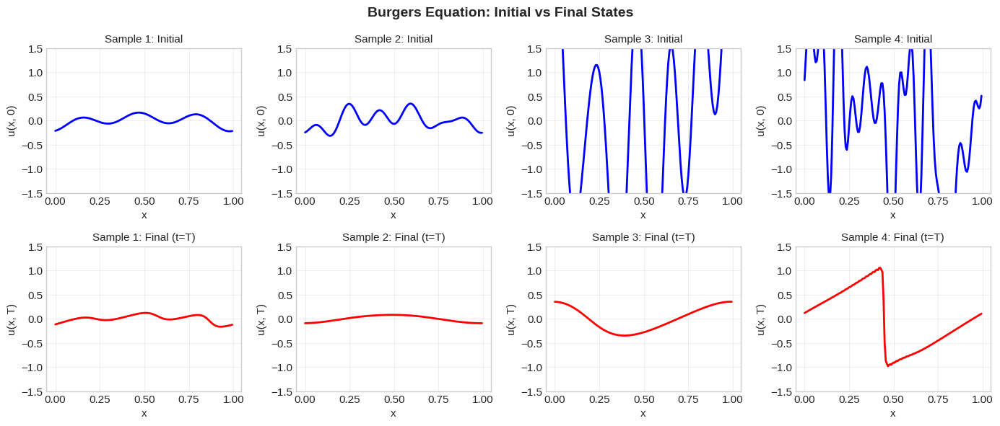

In [4]:
# Extract data
initial = burgers_data['initial'].numpy()  # (N, 1, 160)
final = burgers_data['final'].numpy()      # (N, 1, 160)
n_samples = initial.shape[0]
resolution = initial.shape[-1]

# Spatial grid (domain [0, 1])
x = np.linspace(0, 1, resolution, endpoint=False)

# Plot several samples
n_show = 4
fig, axes = plt.subplots(2, n_show, figsize=(14, 6))

for i in range(n_show):
    # Initial condition
    axes[0, i].plot(x, initial[i, 0, :], 'b-', linewidth=2)
    axes[0, i].set_title(f'Sample {i+1}: Initial', fontsize=11)
    axes[0, i].set_xlabel('x')
    axes[0, i].set_ylabel('u(x, 0)')
    axes[0, i].set_ylim(-1.5, 1.5)
    axes[0, i].grid(True, alpha=0.3)
    
    # Final state
    axes[1, i].plot(x, final[i, 0, :], 'r-', linewidth=2)
    axes[1, i].set_title(f'Sample {i+1}: Final (t=T)', fontsize=11)
    axes[1, i].set_xlabel('x')
    axes[1, i].set_ylabel('u(x, T)')
    axes[1, i].set_ylim(-1.5, 1.5)
    axes[1, i].grid(True, alpha=0.3)

plt.suptitle('Burgers Equation: Initial vs Final States', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Spatio-Temporal Evolution (Heatmaps)

Visualize the full trajectory as a space-time heatmap showing how the solution evolves.

/tmp/ipykernel_9666/2893225830.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


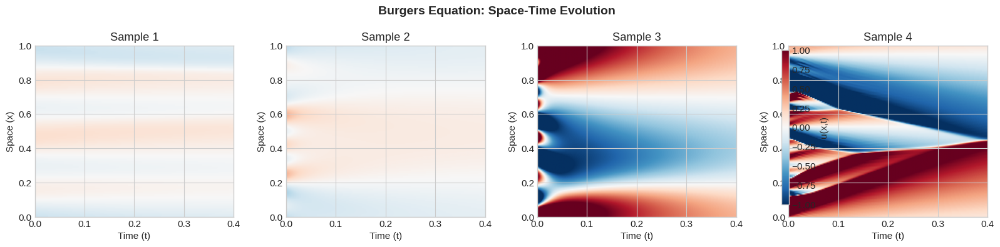

In [5]:
# Get trajectory data — includes initial condition (store_trajectory=True gives (N, T+1, C, 160))
trajectory = burgers_data['trajectory'].numpy()  # (N, T+1, 1, 160)
n_timesteps = trajectory.shape[1]
total_time = burgers_cfg.dt * burgers_cfg.num_steps
full_time = np.linspace(0, total_time, n_timesteps)

# Plot space-time heatmaps for several samples
n_show = 4
fig, axes = plt.subplots(1, n_show, figsize=(16, 4))

for i in range(n_show):
    # Extract trajectory for sample i: (T+1, 160)
    traj_i = trajectory[i, :, 0, :]
    
    im = axes[i].imshow(
        traj_i.T,
        aspect='auto',
        origin='lower',
        cmap='RdBu_r',
        vmin=-1, vmax=1,
        extent=[0, full_time[-1], 0, 1]
    )
    axes[i].set_xlabel('Time (t)')
    axes[i].set_ylabel('Space (x)')
    axes[i].set_title(f'Sample {i+1}')

plt.suptitle('Burgers Equation: Space-Time Evolution', fontsize=14, fontweight='bold')
fig.colorbar(im, ax=axes, label='u(x,t)', shrink=0.8)
plt.tight_layout()
plt.show()

## Animation of Time Evolution

Create an animation showing the solution evolving over time.

In [6]:
# Create animation for a single sample
sample_idx = 0
traj = trajectory[sample_idx, :, 0, :]  # (T+1, 160)

fig, ax = plt.subplots(figsize=(10, 5))
line, = ax.plot(x, traj[0], 'b-', linewidth=2)
ax.set_xlim(0, 1)
ax.set_ylim(-1.5, 1.5)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('u(x, t)', fontsize=12)
ax.grid(True, alpha=0.3)
title = ax.set_title(f'Burgers Equation Evolution (t = 0.00)', fontsize=14)

def animate(frame):
    line.set_ydata(traj[frame])
    title.set_text(f'Burgers Equation Evolution (t = {full_time[frame]:.4f})')
    return line, title

anim = FuncAnimation(fig, animate, frames=len(full_time), interval=50, blit=True)
plt.close()

# Display animation
HTML(anim.to_jshtml())

## Poisson 2D Visualization

Generate and visualize the 2D Poisson equation source-solution pairs using the Exponax module.

In [7]:
# Configure and generate Poisson 2D data
poisson_cfg = PoissonConfig(
    num_spatial_dims=2,
    num_points=64,
    domain_extent=10.0,
    num_samples=50,
    seed=42,
    ic_cutoff_min=3,         # per-sample spectral cutoff range
    ic_cutoff_max=20,
    amplitude_min=0.1,       # per-sample amplitude scaling
    amplitude_max=5.0,
    gaussian_bump_prob=0.5,  # 50% Gaussian-bump source terms
)

poisson_gen = PoissonGenerator(config=poisson_cfg)
poisson_dataset = poisson_gen.generate()

# Access the raw data tensors
poisson_data = poisson_dataset.get_raw_data()

print("\nPoisson 2D Dataset")
print("=" * 50)
print(f"Data keys: {list(poisson_data.keys())}")
print(f"\nShapes:")
print(f"  Source terms (f):   {poisson_data['source'].shape}")
print(f"  Solutions (u):      {poisson_data['solution'].shape}")
cfg_dict_p = poisson_dataset.get_config()
print(f"\nGeneration config:")
print(f"  Spectral cutoff:    [{cfg_dict_p['ic_cutoff_min']}, {cfg_dict_p['ic_cutoff_max']}]  (per-sample)")
print(f"  Amplitude range:    [{cfg_dict_p['amplitude_min']}, {cfg_dict_p['amplitude_max']}]")
print(f"  Gaussian bump prob: {cfg_dict_p['gaussian_bump_prob']}")


Generated Poisson 2D dataset: 50 samples, 64x64 grid

Poisson 2D Dataset
Data keys: ['source', 'solution']

Shapes:
  Source terms (f):   torch.Size([50, 1, 64, 64])
  Solutions (u):      torch.Size([50, 1, 64, 64])

Generation config:
  Spectral cutoff:    [3, 20]  (per-sample)
  Amplitude range:    [0.1, 5.0]
  Gaussian bump prob: 0.5


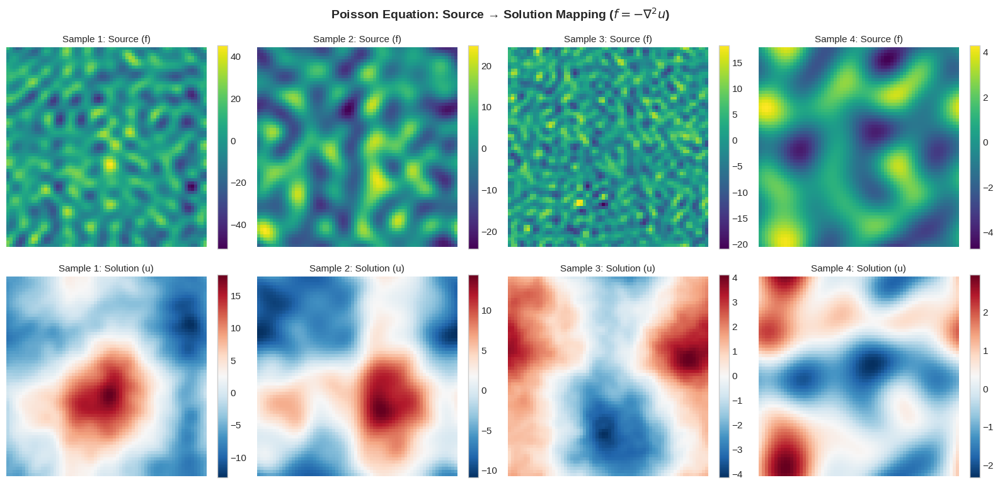

In [8]:
# Extract source and solution
source = poisson_data['source'].numpy()      # (N, 1, 64, 64)
solution = poisson_data['solution'].numpy()  # (N, 1, 64, 64)

# Plot several source-solution pairs
n_show = 4
fig, axes = plt.subplots(2, n_show, figsize=(16, 8))

for i in range(n_show):
    # Source term (f)
    im1 = axes[0, i].imshow(source[i, 0], cmap='viridis', origin='lower')
    axes[0, i].set_title(f'Sample {i+1}: Source (f)', fontsize=11)
    axes[0, i].axis('off')
    plt.colorbar(im1, ax=axes[0, i], fraction=0.046)
    
    # Solution (u)
    im2 = axes[1, i].imshow(solution[i, 0], cmap='RdBu_r', origin='lower')
    axes[1, i].set_title(f'Sample {i+1}: Solution (u)', fontsize=11)
    axes[1, i].axis('off')
    plt.colorbar(im2, ax=axes[1, i], fraction=0.046)

plt.suptitle('Poisson Equation: Source → Solution Mapping ($f = -\\nabla^2 u$)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Statistical Analysis

Analyze the distribution of values across the datasets.

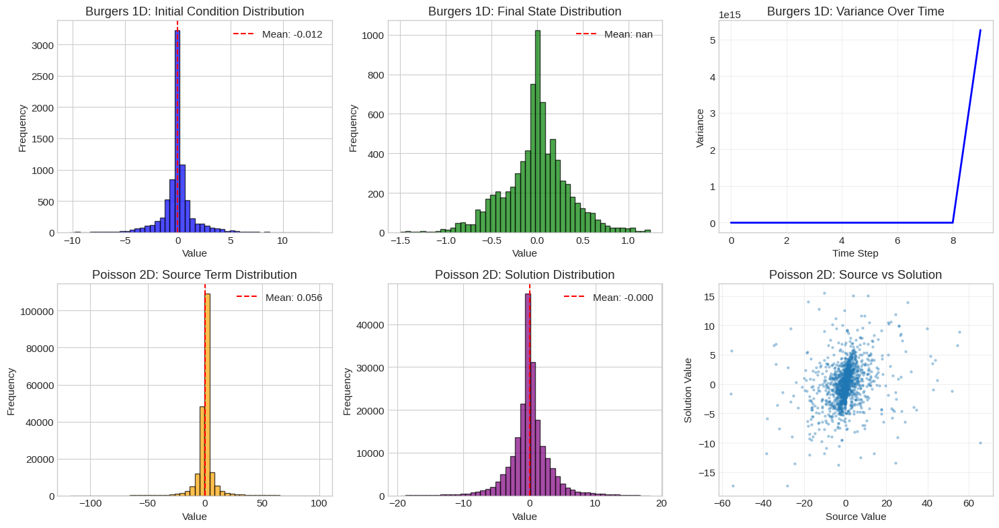


DATASET SUMMARY STATISTICS

Burgers 1D:
  Initial shape: (50, 1, 160)
  Final shape:   (50, 1, 160)
  Initial - Mean: -0.0121, Std: 1.5973
  Final   - Mean: nan, Std: nan
  Range: [-10.2339, 13.4676]

Poisson 2D:
  Source shape: (50, 1, 64, 64)
  Solution shape: (50, 1, 64, 64)
  Source   - Mean: 0.0560, Std: 7.6404
  Solution - Mean: -0.0000, Std: 3.0363


In [9]:
# Statistical analysis of the datasets
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

# Burgers 1D statistics
burgers_initial_flat = initial.flatten()
burgers_final_flat = final.flatten()

axes[0, 0].hist(burgers_initial_flat, bins=50, alpha=0.7, color='blue', edgecolor='black')
axes[0, 0].set_xlabel('Value')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Burgers 1D: Initial Condition Distribution')
axes[0, 0].axvline(burgers_initial_flat.mean(), color='red', linestyle='--', label=f'Mean: {burgers_initial_flat.mean():.3f}')
axes[0, 0].legend()

axes[0, 1].hist(burgers_final_flat, bins=50, alpha=0.7, color='green', edgecolor='black')
axes[0, 1].set_xlabel('Value')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Burgers 1D: Final State Distribution')
axes[0, 1].axvline(burgers_final_flat.mean(), color='red', linestyle='--', label=f'Mean: {burgers_final_flat.mean():.3f}')
axes[0, 1].legend()

# Variance over time for Burgers
traj_tensor = torch.from_numpy(trajectory)  # (N, T+1, 1, 160)
burgers_variance = traj_tensor.var(dim=(0, 2, 3)).numpy()  # Variance across samples, channels, space
axes[0, 2].plot(burgers_variance, 'b-', linewidth=2)
axes[0, 2].set_xlabel('Time Step')
axes[0, 2].set_ylabel('Variance')
axes[0, 2].set_title('Burgers 1D: Variance Over Time')
axes[0, 2].grid(True, alpha=0.3)

# Poisson 2D statistics
source_flat = source.flatten()
solution_flat = solution.flatten()

axes[1, 0].hist(source_flat, bins=50, alpha=0.7, color='orange', edgecolor='black')
axes[1, 0].set_xlabel('Value')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_title('Poisson 2D: Source Term Distribution')
axes[1, 0].axvline(source_flat.mean(), color='red', linestyle='--', label=f'Mean: {source_flat.mean():.3f}')
axes[1, 0].legend()

axes[1, 1].hist(solution_flat, bins=50, alpha=0.7, color='purple', edgecolor='black')
axes[1, 1].set_xlabel('Value')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_title('Poisson 2D: Solution Distribution')
axes[1, 1].axvline(solution_flat.mean(), color='red', linestyle='--', label=f'Mean: {solution_flat.mean():.3f}')
axes[1, 1].legend()

# Source vs Solution correlation
axes[1, 2].scatter(source_flat[::100], solution_flat[::100], alpha=0.3, s=5)
axes[1, 2].set_xlabel('Source Value')
axes[1, 2].set_ylabel('Solution Value')
axes[1, 2].set_title('Poisson 2D: Source vs Solution')
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics (also available via dataset.get_stats())
print("\n" + "="*60)
print("DATASET SUMMARY STATISTICS")
print("="*60)

burgers_stats = burgers_dataset.get_stats()
print(f"\nBurgers 1D:")
print(f"  Initial shape: {initial.shape}")
print(f"  Final shape:   {final.shape}")
print(f"  Initial - Mean: {burgers_initial_flat.mean():.4f}, Std: {burgers_initial_flat.std():.4f}")
print(f"  Final   - Mean: {burgers_final_flat.mean():.4f}, Std: {burgers_final_flat.std():.4f}")
print(f"  Range: [{initial.min():.4f}, {initial.max():.4f}]")

poisson_stats = poisson_dataset.get_stats()
print(f"\nPoisson 2D:")
print(f"  Source shape: {source.shape}")
print(f"  Solution shape: {solution.shape}")
print(f"  Source   - Mean: {source_flat.mean():.4f}, Std: {source_flat.std():.4f}")
print(f"  Solution - Mean: {solution_flat.mean():.4f}, Std: {solution_flat.std():.4f}")

## Multiple Samples Comparison

Compare multiple samples side by side to see the variety in the generated data.

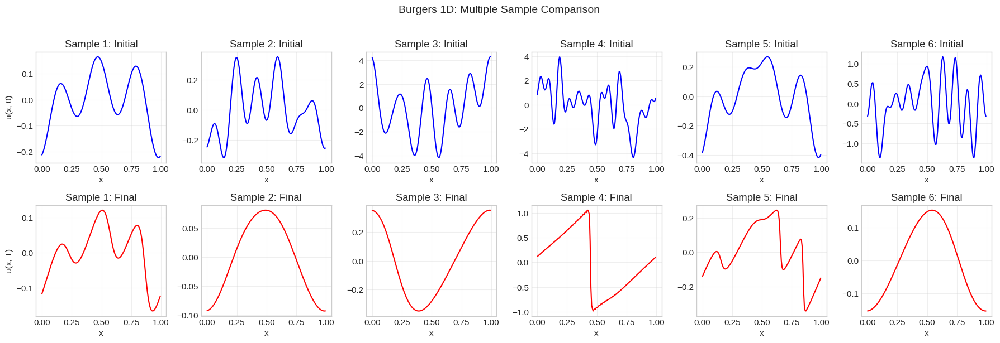

In [10]:
# Compare multiple Burgers samples
n_compare = 6
fig, axes = plt.subplots(2, n_compare, figsize=(18, 6))

for i in range(n_compare):
    # Initial conditions (top row)
    axes[0, i].plot(x, initial[i, 0, :], 'b-', linewidth=1.5)
    axes[0, i].set_title(f'Sample {i+1}: Initial')
    axes[0, i].set_xlabel('x')
    if i == 0:
        axes[0, i].set_ylabel('u(x, 0)')
    axes[0, i].grid(True, alpha=0.3)
    
    # Final states (bottom row)
    axes[1, i].plot(x, final[i, 0, :], 'r-', linewidth=1.5)
    axes[1, i].set_title(f'Sample {i+1}: Final')
    axes[1, i].set_xlabel('x')
    if i == 0:
        axes[1, i].set_ylabel('u(x, T)')
    axes[1, i].grid(True, alpha=0.3)

plt.suptitle('Burgers 1D: Multiple Sample Comparison', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

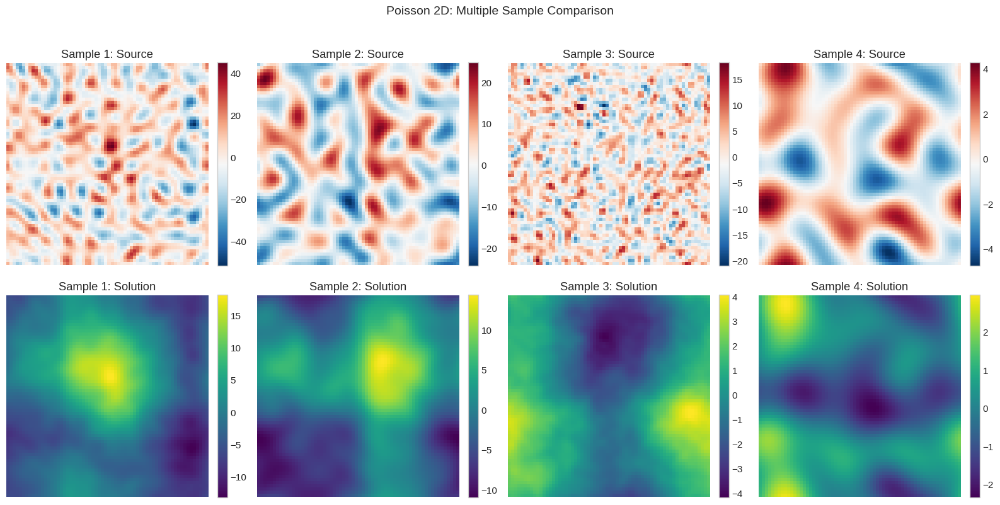

In [11]:
# Compare multiple Poisson samples
n_compare = 4
fig, axes = plt.subplots(2, n_compare, figsize=(16, 8))

for i in range(n_compare):
    # Source terms (top row)
    im1 = axes[0, i].imshow(source[i, 0], cmap='RdBu_r', aspect='equal')
    axes[0, i].set_title(f'Sample {i+1}: Source')
    axes[0, i].axis('off')
    plt.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)
    
    # Solutions (bottom row)
    im2 = axes[1, i].imshow(solution[i, 0], cmap='viridis', aspect='equal')
    axes[1, i].set_title(f'Sample {i+1}: Solution')
    axes[1, i].axis('off')
    plt.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)

plt.suptitle('Poisson 2D: Multiple Sample Comparison', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## Energy/Norm Evolution

Track how the solution norm evolves over time for Burgers equation.

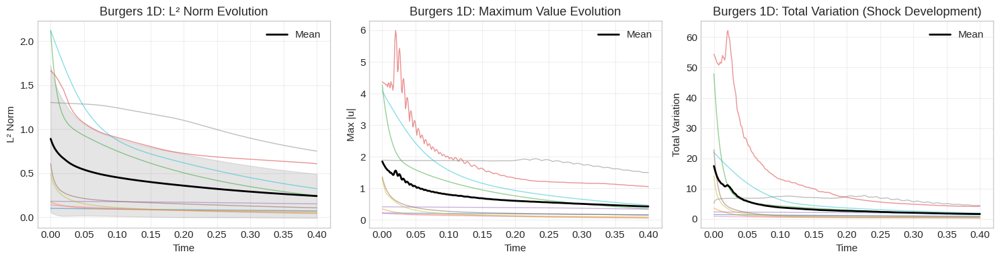

In [12]:
# Compute L2 norm over time for each sample
# trajectory: (N, T+1, 1, 160)
n_samples_plot = min(10, trajectory.shape[0])
n_timesteps = trajectory.shape[1]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

traj_tensor = torch.from_numpy(trajectory[:n_samples_plot])  # (n_samples, T+1, 1, 160)

# L2 norm evolution
l2_norms = torch.sqrt((traj_tensor[:, :, 0, :] ** 2).mean(dim=-1))  # (samples, time)
time_axis = np.linspace(0, total_time, n_timesteps)

for i in range(n_samples_plot):
    axes[0].plot(time_axis, l2_norms[i].numpy(), alpha=0.5, linewidth=1)
axes[0].plot(time_axis, l2_norms.mean(dim=0).numpy(), 'k-', linewidth=2, label='Mean')
axes[0].fill_between(time_axis, 
                      (l2_norms.mean(dim=0) - l2_norms.std(dim=0)).numpy(),
                      (l2_norms.mean(dim=0) + l2_norms.std(dim=0)).numpy(),
                      alpha=0.2, color='gray')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('L² Norm')
axes[0].set_title('Burgers 1D: L² Norm Evolution')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Maximum value evolution
max_vals = traj_tensor[:, :, 0, :].abs().max(dim=-1)[0]  # (samples, time)
for i in range(n_samples_plot):
    axes[1].plot(time_axis, max_vals[i].numpy(), alpha=0.5, linewidth=1)
axes[1].plot(time_axis, max_vals.mean(dim=0).numpy(), 'k-', linewidth=2, label='Mean')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Max |u|')
axes[1].set_title('Burgers 1D: Maximum Value Evolution')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Total variation (measure of shock sharpness)
total_variation = torch.abs(torch.diff(traj_tensor[:, :, 0, :], dim=-1)).sum(dim=-1)
for i in range(n_samples_plot):
    axes[2].plot(time_axis, total_variation[i].numpy(), alpha=0.5, linewidth=1)
axes[2].plot(time_axis, total_variation.mean(dim=0).numpy(), 'k-', linewidth=2, label='Mean')
axes[2].set_xlabel('Time')
axes[2].set_ylabel('Total Variation')
axes[2].set_title('Burgers 1D: Total Variation (Shock Development)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Darcy Flow / Variable-Coefficient Poisson

Generate and visualize $-\nabla \cdot (\kappa(x)\,\nabla u) = f(x)$ datasets using the new `DarcyGenerator`.  The permeability field $\kappa$ is a **log-normal Gaussian random field**, making this a significantly harder operator-learning problem than constant-coefficient Poisson — every sample has a different spatial operator.

The pipeline:
1. Draw per-sample $\kappa$ fields from a log-normal GRF with spectral decay $S(|k|) \propto (\tau^2 + |k|^2)^{-\alpha}$.
2. Draw per-sample $f$ fields using the same Fourier + Gaussian-bump mixture as `PoissonGenerator`.
3. Solve $-\nabla\cdot(\kappa\nabla u)=f$ via **finite differences + fixed-step conjugate gradient** (fully `jax.vmap`-compatible).


In [13]:
# Generate Darcy 2D forward dataset
darcy_cfg = DarcyConfig(
    num_spatial_dims=2,
    num_points=32,         # small grid — fast prototyping (use 64+ for training)
    domain_extent=1.0,
    num_samples=50,
    seed=7,
    kappa_alpha=2.0,       # GRF spectral decay exponent (FNO benchmark setting)
    kappa_tau=3.0,         # GRF inverse correlation length
    kappa_scale=1.0,       # log-contrast of κ  →  κ ∈ [e⁻², e²] ≈ [0.14, 7.4]
    kappa_min=0.1,         # hard positivity floor (ellipticity)
    f_cutoff_min=3,
    f_cutoff_max=12,
    cg_steps=200,          # 200 CG iters is plenty for 32×32
)

darcy_gen = DarcyGenerator(config=darcy_cfg)
darcy_dataset = darcy_gen.generate(problem='forward')

darcy_data = darcy_dataset.get_raw_data()

print("\nDarcy Flow 2D Dataset (forward)")
print("=" * 50)
print(f"Data keys: {list(darcy_data.keys())}")
print(f"\nShapes:")
print(f"  Permeability (κ):  {darcy_data['kappa'].shape}")
print(f"  Source term  (f):  {darcy_data['source'].shape}")
print(f"  Solution     (u):  {darcy_data['solution'].shape}")
print(f"\nDataset item shapes (for the flow trainer):")
sample = darcy_dataset[0]
print(f"  sample['input']  = cat([κ, f], dim=0):  {sample['input'].shape}")
print(f"  sample['target'] = u:                   {sample['target'].shape}")
print(f"\nField statistics:")
for key, s in darcy_dataset.get_stats().items():
    print(f"  {key:8s}  mean={s['mean']:+.4f}  std={s['std']:.4f}  "
          f"min={s['min']:+.4f}  max={s['max']:+.4f}")


Generated Darcy 2D dataset: 50 samples, 32x32 grid, κ ~ LogNormal(α=2.0, τ=3.0, scale=1.0), CG steps=200

Darcy Flow 2D Dataset (forward)
Data keys: ['kappa', 'source', 'solution']

Shapes:
  Permeability (κ):  torch.Size([50, 1, 32, 32])
  Source term  (f):  torch.Size([50, 1, 32, 32])
  Solution     (u):  torch.Size([50, 1, 32, 32])

Dataset item shapes (for the flow trainer):
  sample['input']  = cat([κ, f], dim=0):  torch.Size([2, 32, 32])
  sample['target'] = u:                   torch.Size([1, 32, 32])

Field statistics:
  kappa     mean=+1.6527  std=2.1590  min=+0.1000  max=+56.4772
  source    mean=-0.0675  std=6.0908  min=-57.3746  max=+48.7548
  solution  mean=-0.0010  std=0.0304  min=-0.2865  max=+0.2729


### κ, f → u Triplets

Each sample consists of three correlated fields: the permeability $\kappa$, the source $f$, and the resulting solution $u$.  Notice how the spatial structure of $\kappa$ bends and localises the solution $u$ relative to simple constant-coefficient Poisson.


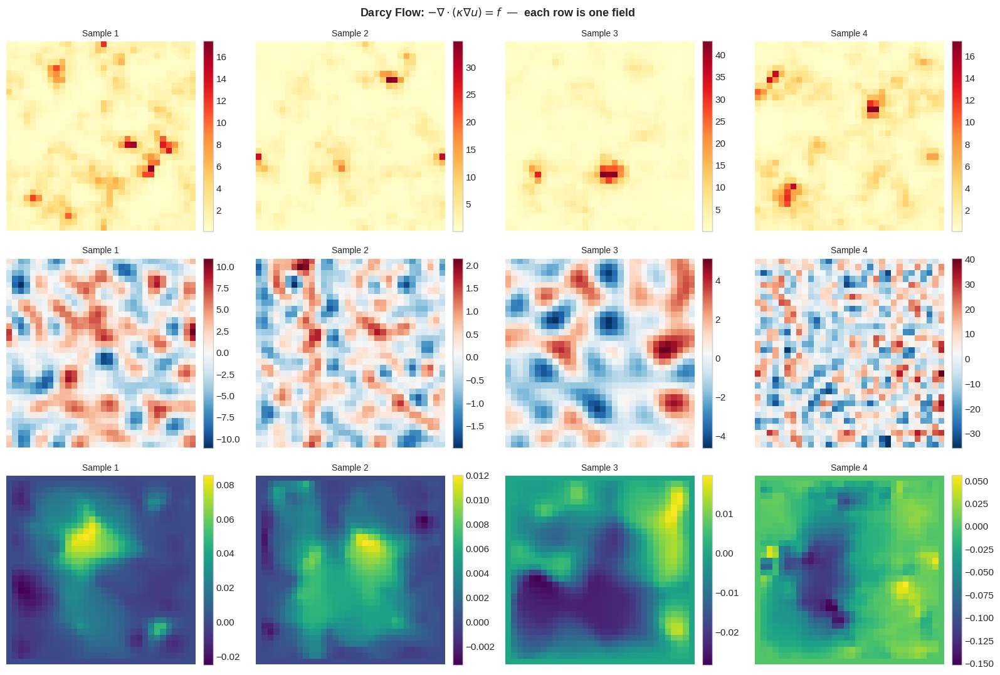

In [14]:
# Visualise κ / f / u triplets for several samples
kappa_np  = darcy_data['kappa'].numpy()     # (N, 1, 32, 32)
source_d  = darcy_data['source'].numpy()    # (N, 1, 32, 32)
solution_d = darcy_data['solution'].numpy() # (N, 1, 32, 32)

n_show = 4
fig, axes = plt.subplots(3, n_show, figsize=(16, 11))
row_labels = [r'$\kappa(x)$  — permeability', r'$f(x)$  — source term', r'$u(x)$  — solution']
cmaps      = ['YlOrRd',  'RdBu_r',  'viridis']

for i in range(n_show):
    for row, (field, cmap) in enumerate(zip([kappa_np, source_d, solution_d], cmaps)):
        im = axes[row, i].imshow(field[i, 0], cmap=cmap, origin='lower')
        axes[row, i].set_title(f'Sample {i+1}', fontsize=10)
        axes[row, i].axis('off')
        plt.colorbar(im, ax=axes[row, i], fraction=0.046, pad=0.04)

for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=11)

plt.suptitle(r'Darcy Flow: $-\nabla\cdot(\kappa\nabla u) = f$  —  each row is one field',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


### Diversity of κ Fields

The log-normal GRF ensures every sample has a spatially unique permeability landscape — some smooth and slowly-varying, others patchy with sharp high/low-contrast regions.


/tmp/ipykernel_9666/204199579.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_9666/204199579.py:16: UserWarning: Glyph 8712 (\N{ELEMENT OF}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/home/breziskato/Desktop/projects/.venv/flowpde/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8712 (\N{ELEMENT OF}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


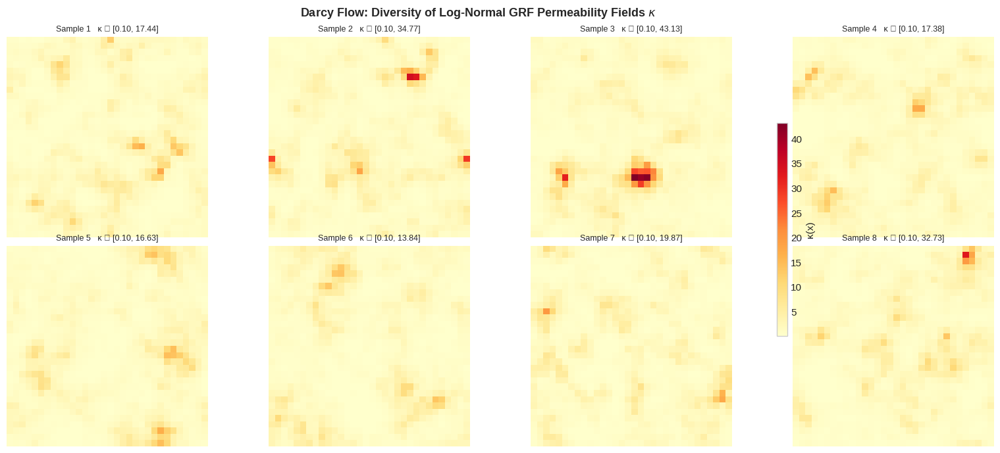

In [15]:
# Visualise the diversity of κ fields across the dataset
n_show = 8
kappa_show = kappa_np[:n_show, 0]          # (8, 32, 32)
vmin, vmax = kappa_show.min(), kappa_show.max()

fig, axes = plt.subplots(2, 4, figsize=(16, 7))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(kappa_show[i], cmap='YlOrRd', origin='lower', vmin=vmin, vmax=vmax)
    lo, hi = kappa_show[i].min(), kappa_show[i].max()
    ax.set_title(f'Sample {i+1}   κ ∈ [{lo:.2f}, {hi:.2f}]', fontsize=9)
    ax.axis('off')

fig.colorbar(im, ax=axes, label='κ(x)', shrink=0.6, pad=0.02)
plt.suptitle(r'Darcy Flow: Diversity of Log-Normal GRF Permeability Fields $\kappa$',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


### Inverse Problem with Partial Observations

For the **inverse problem** the model input is a (noisy, partially observed) solution $u$ and the target is the permeability $\kappa$.  `obs_mask_fraction` controls the fraction of spatial points that are visible; `obs_noise_std` adds measurement noise.


Generated Darcy 2D dataset: 16 samples, 32x32 grid, κ ~ LogNormal(α=2.0, τ=3.0, scale=1.0), CG steps=200

Darcy Flow 2D Dataset (inverse)
Data keys: ['kappa', 'source', 'solution', 'obs_mask']

Dataset item shapes:
  sample['input']    (noisy / masked u):  torch.Size([1, 32, 32])
  sample['target']   (κ to recover):      torch.Size([1, 32, 32])
  sample['obs_mask'] (1=observed, 0=NaN): torch.Size([1, 32, 32])

  Empirical observation fraction: 70.1%


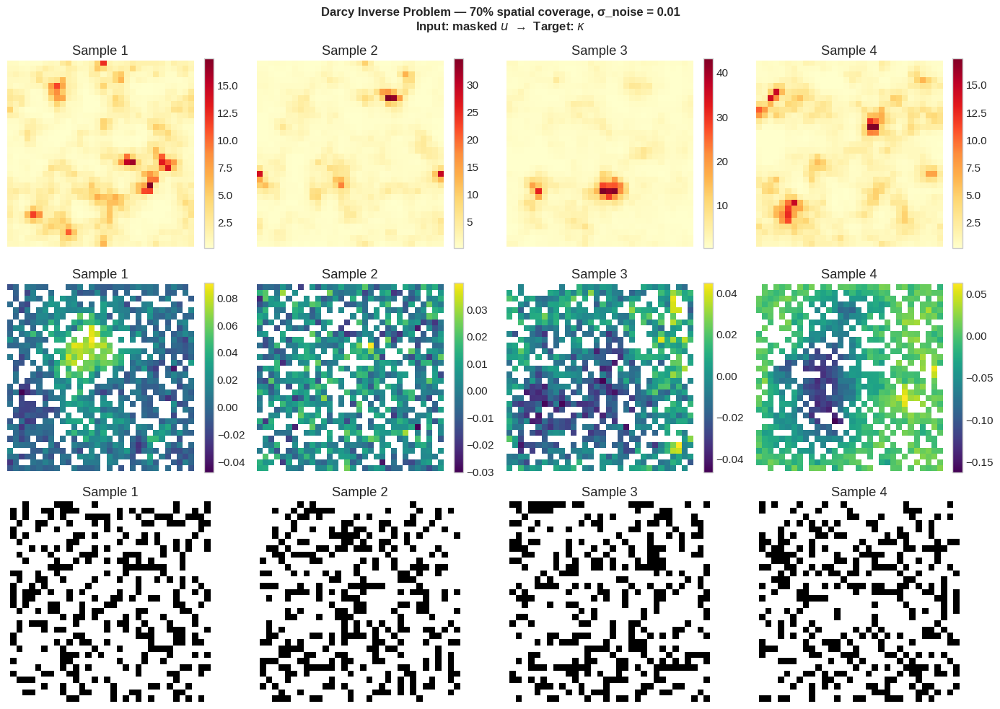

In [16]:
# Darcy inverse problem: recover κ from a partially-observed, noisy solution
darcy_inv_cfg = DarcyConfig(
    num_spatial_dims=2,
    num_points=32,
    domain_extent=1.0,
    num_samples=16,
    seed=7,                    # same seed → same κ, f, u as forward dataset
    kappa_alpha=2.0,
    kappa_tau=3.0,
    cg_steps=200,
    obs_noise_std=0.01,        # σ = 1% of signal — additive Gaussian noise
    obs_mask_fraction=0.7,     # 70% of grid points are observed
)

darcy_inv_gen = DarcyGenerator(config=darcy_inv_cfg)
darcy_inv_dataset = darcy_inv_gen.generate(problem='inverse')
darcy_inv_data = darcy_inv_dataset.get_raw_data()

print("\nDarcy Flow 2D Dataset (inverse)")
print("=" * 50)
print(f"Data keys: {list(darcy_inv_data.keys())}")
inv_sample = darcy_inv_dataset[0]
print(f"\nDataset item shapes:")
print(f"  sample['input']    (noisy / masked u):  {inv_sample['input'].shape}")
print(f"  sample['target']   (κ to recover):      {inv_sample['target'].shape}")
print(f"  sample['obs_mask'] (1=observed, 0=NaN): {inv_sample['obs_mask'].shape}")
obs_frac = float(darcy_inv_data['obs_mask'].mean())
print(f"\n  Empirical observation fraction: {obs_frac:.1%}")

# ── Visualise: κ target | masked+noisy observation | observation mask ─────
kappa_inv  = darcy_inv_data['kappa'].numpy()     # (16, 1, 32, 32)
sol_masked = darcy_inv_data['solution'].numpy()  # (16, 1, 32, 32) — noisy + masked
mask_np    = darcy_inv_data['obs_mask'].numpy()  # (16, 1, 32, 32)

n_show = 4
fig, axes = plt.subplots(3, n_show, figsize=(14, 10))
titles_rows = ['κ (target to recover)', 'Observed u (input, noisy + masked)', 'Observation mask']

for i in range(n_show):
    # Row 0: ground-truth κ
    im0 = axes[0, i].imshow(kappa_inv[i, 0], cmap='YlOrRd', origin='lower')
    axes[0, i].set_title(f'Sample {i+1}')
    axes[0, i].axis('off')
    plt.colorbar(im0, ax=axes[0, i], fraction=0.046)

    # Row 1: masked + noisy u  (NaN = unobserved)
    obs_field = np.where(mask_np[i, 0].astype(bool), sol_masked[i, 0], np.nan)
    im1 = axes[1, i].imshow(obs_field, cmap='viridis', origin='lower')
    axes[1, i].set_title(f'Sample {i+1}')
    axes[1, i].axis('off')
    plt.colorbar(im1, ax=axes[1, i], fraction=0.046)

    # Row 2: binary observation mask
    axes[2, i].imshow(mask_np[i, 0], cmap='gray', origin='lower', vmin=0, vmax=1)
    axes[2, i].set_title(f'Sample {i+1}')
    axes[2, i].axis('off')

for row, label in enumerate(titles_rows):
    axes[row, 0].set_ylabel(label, fontsize=10)

plt.suptitle(
    f'Darcy Inverse Problem — 70% spatial coverage, σ_noise = 0.01\n'
    r'Input: masked $u$  →  Target: $\kappa$',
    fontsize=12, fontweight='bold'
)
plt.tight_layout()
plt.show()
